# MAN TruckScenes devkit tutorial

Welcome to the MAN TruckScenes tutorial. This demo assumes the database itself is available at `/data/man-truckscenes`, and loads a mini version of the full dataset.

## A Gentle Introduction to TruckScenes

In this part of the tutorial, let us go through a top-down introduction of our database. Our dataset comprises of elemental building blocks that are the following:

1. `scene` - 20 second snippet of our truck's journey.
2. `sample` - An annotated snapshot of a scene at a particular timestamp.
3. `sample_data` - Data collected from a particular sensor.
4. `ego_pose` - Ego vehicle poses at a particular timestamp.
5. `ego_motion_cabin` - Ego vehicle cabin motion at a particular timestamp.
6. `ego_motion_chassis` - Ego vehicle chassis motion at a particular timestamp.
7. `sensor` - A specific sensor type.
8. `calibrated sensor` - Definition of a particular sensor as calibrated on a particular vehicle.
9. `instance` - Enumeration of all object instance we observed.
10. `category` - Taxonomy of object categories (e.g. vehicle, human). 
11. `attribute` - Property of an instance that can change while the category remains the same.
12. `visibility` - Fraction of pixels visible in all the images collected from 4 different cameras.
13. `sample_annotation` - An annotated instance of an object within our interest.

The database schema is visualized below. For more information see the [truckscenes schema](https://github.com/nutonomy/manscenes-devkit/blob/master/docs/schema_manscenes.md) page.
![](https://www.manscenes.org/public/images/manscenes-schema.svg)

The dataset format is build on top of the nuScenes format.  
The tutorial is copied and adapted from [nuscenes-devkit](https://github.com/nutonomy/nuscenes-devkit)

## Initialization

In [ ]:
%matplotlib inline
from truckscenes import TruckScenes

trucksc = TruckScenes('v1.0-mini', '/data/man-truckscenes', True)

Loading truckscenes tables for version v1.0-mini...


11 attribute,
18 calibrated_sensor,
27 category,
20090 ego_motion_cabin,
20089 ego_motion_chassis,
20116 ego_pose,
1094 instance,
400 sample,
25921 sample_annotation,
43556 sample_data,
10 scene,
18 sensor,
4 visibility,
Done loading in 0.679 seconds.
Reverse indexing ...
Done reverse indexing in 0.2 seconds.


## A look at the dataset

### 1. `scene`

TruckScenes is a large scale database that features annotated samples across ***747 scenes*** of approximately 20 seconds each. Let's take a look at the scenes that we have in the loaded database.

In [4]:
trucksc.list_scenes()

[23-08-26 08:13:49] scene-3f542f89ec5241b6a4e30ca743adcf34-29: length: 19.50s, #anns: 3306, desc: weather.overcast;area.highway;daytime.morning;seaso...
[23-09-06 09:09:31] scene-3195e3bfd1de4f9ba82f874790c7856c-15: length: 19.50s, #anns: 1519, desc: weather.overcast;area.highway;daytime.noon;season.s...
[23-09-17 08:19:52] scene-6be74229febb4aad9e7ae1a37217b231-4: length: 19.50s, #anns: 621, desc: weather.overcast;area.terminal;daytime.morning;seas...
[23-09-23 12:49:32] scene-0044384af3d8494e913fb8b14915239e-3: length: 19.50s, #anns: 1280, desc: weather.clear;area.terminal;daytime.noon;season.sum...
[23-10-07 17:35:24] scene-13f4b71b1bd04a9e88747ad8f58a3f67-4: length: 19.50s, #anns: 1255, desc: weather.clear;area.highway;daytime.evening;season.a...
[23-11-14 14:59:34] scene-b201f6e737e34c2d87830fc1e2911516-6: length: 19.50s, #anns: 2938, desc: weather.rain;area.highway;daytime.noon;season.autum...
[23-11-28 12:22:50] scene-b13542304b244af585a646082c57a079-1: length: 19.50s, #anns: 24

Let's look at a scene metadata

In [5]:
my_scene = trucksc.scene[0]
my_scene

{'name': 'scene-0044384af3d8494e913fb8b14915239e-3',
 'description': 'weather.clear;area.terminal;daytime.noon;season.summer;lighting.illuminated;structure.regular;construction.unchanged',
 'token': '044c648ac12345f1aedf33c9f91cdc5a',
 'log_token': '',
 'nbr_samples': 40,
 'first_sample_token': '32d2bcf46e734dffb14fe2e0a823d059',
 'last_sample_token': '94640f753b284a1c9c0e8694243f60cd'}

### 2. `sample`

In scenes, we annotate our data every half a second (2 Hz).

We define `sample` as an ***annotated keyframe of a scene at a given timestamp***. A keyframe is a frame where the time-stamps of data from all the sensors should be very close to the time-stamp of the sample it points to.

Now, let us look at the first annotated sample in this scene.

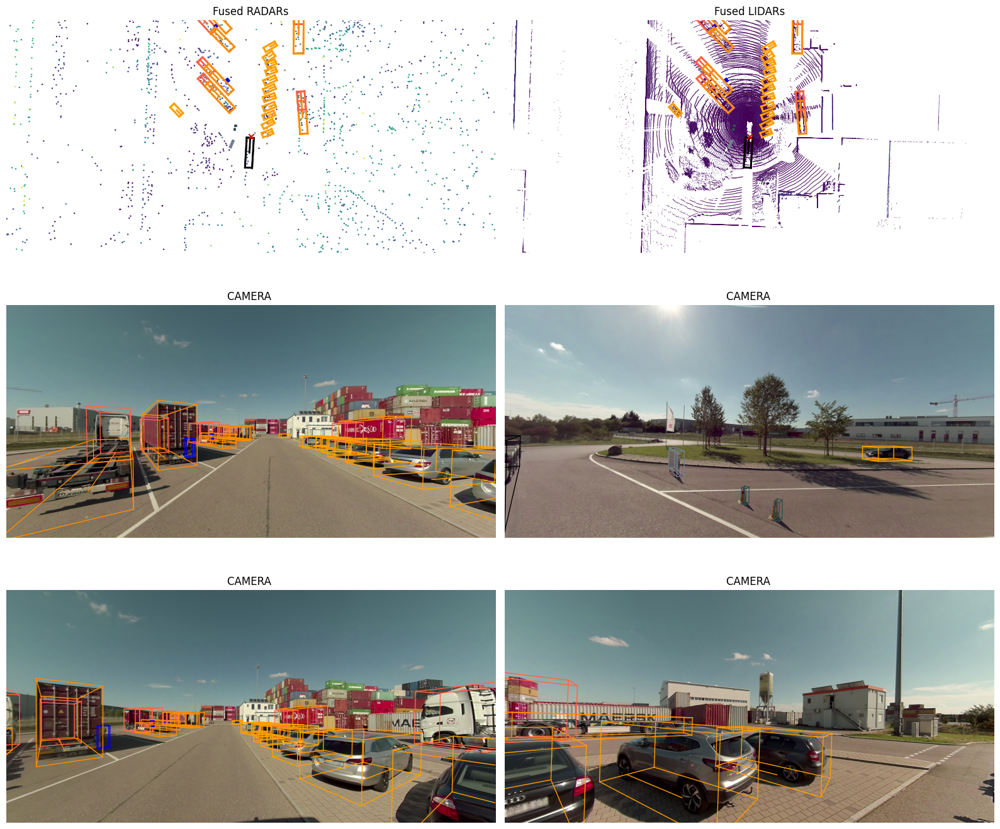

In [6]:
first_sample_token = my_scene['first_sample_token']
trucksc.render_sample(first_sample_token)

As you can see, the annotations in the front of the vehicle align very well with the image data, while there is a small deviation in the backward facing cameras. This is due to the small difference in the recording time of both sensors in comparison to the sample timestamp.

Let's examine its metadata

In [7]:
my_sample = trucksc.get('sample', first_sample_token)
my_sample

{'token': '32d2bcf46e734dffb14fe2e0a823d059',
 'scene_token': '044c648ac12345f1aedf33c9f91cdc5a',
 'timestamp': 1695473372698161,
 'prev': '',
 'next': 'deb7b3f332f042d49e7636d6e4959354',
 'data': {'RADAR_RIGHT_BACK': 'c790efd2151d491aae635234a5df26d8',
  'RADAR_RIGHT_SIDE': '7f3083ba7f2e49678b4ccbc2fd14f590',
  'RADAR_RIGHT_FRONT': '36c9a2c6b3ee4d9f9d01c902521cbb27',
  'RADAR_LEFT_FRONT': '1e6375db490e4563b55fce389b06a53b',
  'RADAR_LEFT_SIDE': 'c58e24c2e644404f85a5c0901d367338',
  'RADAR_LEFT_BACK': 'e940e3abeab34da8833e013c84b52366',
  'LIDAR_LEFT': '9ae8f9fd6cd2458298c82eb6a85119a6',
  'LIDAR_RIGHT': '28a12ab75263458a977dd29ca4e54ee2',
  'LIDAR_TOP_FRONT': '1ac1e8bcd1ed4493a73c011dc2441713',
  'LIDAR_TOP_LEFT': '85c18e7eeb3c42f194eba257dcf6d66c',
  'LIDAR_TOP_RIGHT': '064d8efa5f31493db10f96dbeef91282',
  'LIDAR_REAR': '18b4fe677dc7408b84ebd555c559da16',
  'CAMERA_LEFT_FRONT': '7625b794c8a14e918dc23113ee5d10da',
  'CAMERA_LEFT_BACK': 'c6e32737071942fb9d5bcd8c69a88181',
  'CAMERA_RIG

A useful method is  `list_sample()` which lists all related `sample_data` keyframes and `sample_annotation` associated with a `sample` which we will discuss in detail in the subsequent parts.

In [8]:
trucksc.list_sample(my_sample['token'])

Sample: 32d2bcf46e734dffb14fe2e0a823d059

sample_data_token: c790efd2151d491aae635234a5df26d8, mod: radar, channel: RADAR_RIGHT_BACK
sample_data_token: 7f3083ba7f2e49678b4ccbc2fd14f590, mod: radar, channel: RADAR_RIGHT_SIDE
sample_data_token: 36c9a2c6b3ee4d9f9d01c902521cbb27, mod: radar, channel: RADAR_RIGHT_FRONT
sample_data_token: 1e6375db490e4563b55fce389b06a53b, mod: radar, channel: RADAR_LEFT_FRONT
sample_data_token: c58e24c2e644404f85a5c0901d367338, mod: radar, channel: RADAR_LEFT_SIDE
sample_data_token: e940e3abeab34da8833e013c84b52366, mod: radar, channel: RADAR_LEFT_BACK
sample_data_token: 9ae8f9fd6cd2458298c82eb6a85119a6, mod: lidar, channel: LIDAR_LEFT
sample_data_token: 28a12ab75263458a977dd29ca4e54ee2, mod: lidar, channel: LIDAR_RIGHT
sample_data_token: 1ac1e8bcd1ed4493a73c011dc2441713, mod: lidar, channel: LIDAR_TOP_FRONT
sample_data_token: 85c18e7eeb3c42f194eba257dcf6d66c, mod: lidar, channel: LIDAR_TOP_LEFT
sample_data_token: 064d8efa5f31493db10f96dbeef91282, mod: lidar

### 3. `sample_data`

The MAN TruckScenes dataset contains data that is collected from a full sensor suite. Hence, for each snapshot of a scene, we provide references to a family of data that is collected from these sensors. 

We provide a `data` key to access these:

In [9]:
my_sample['data']

{'RADAR_RIGHT_BACK': 'c790efd2151d491aae635234a5df26d8',
 'RADAR_RIGHT_SIDE': '7f3083ba7f2e49678b4ccbc2fd14f590',
 'RADAR_RIGHT_FRONT': '36c9a2c6b3ee4d9f9d01c902521cbb27',
 'RADAR_LEFT_FRONT': '1e6375db490e4563b55fce389b06a53b',
 'RADAR_LEFT_SIDE': 'c58e24c2e644404f85a5c0901d367338',
 'RADAR_LEFT_BACK': 'e940e3abeab34da8833e013c84b52366',
 'LIDAR_LEFT': '9ae8f9fd6cd2458298c82eb6a85119a6',
 'LIDAR_RIGHT': '28a12ab75263458a977dd29ca4e54ee2',
 'LIDAR_TOP_FRONT': '1ac1e8bcd1ed4493a73c011dc2441713',
 'LIDAR_TOP_LEFT': '85c18e7eeb3c42f194eba257dcf6d66c',
 'LIDAR_TOP_RIGHT': '064d8efa5f31493db10f96dbeef91282',
 'LIDAR_REAR': '18b4fe677dc7408b84ebd555c559da16',
 'CAMERA_LEFT_FRONT': '7625b794c8a14e918dc23113ee5d10da',
 'CAMERA_LEFT_BACK': 'c6e32737071942fb9d5bcd8c69a88181',
 'CAMERA_RIGHT_FRONT': '4e11f21f05be46f3b219a50904ebaf8d',
 'CAMERA_RIGHT_BACK': '4eaf3724d4614476a711d585dd9766cd'}

Notice that the keys are referring to the different sensors that form our sensor suite. Let's take a look at the metadata of a `sample_data` taken from `CAMERA_LEFT_FRONT`.

In [10]:
sensor = 'CAMERA_LEFT_FRONT'
cam_front_data = trucksc.get('sample_data', my_sample['data'][sensor])
cam_front_data

{'token': '7625b794c8a14e918dc23113ee5d10da',
 'sample_token': '32d2bcf46e734dffb14fe2e0a823d059',
 'ego_pose_token': '9f5d4bc97327401cabe5726c0deb153e',
 'calibrated_sensor_token': '1b717cbfe9c34165b18c28a8e9bb746a',
 'timestamp': 1695473372700234,
 'fileformat': 'jpg',
 'is_key_frame': True,
 'height': 943,
 'width': 1980,
 'filename': 'samples/CAMERA_LEFT_FRONT/CAMERA_LEFT_FRONT_1695473372700234.jpg',
 'prev': 'c2232dc05137445d8d625312a2b4ab2c',
 'next': 'e20a0b60a0e846779dc2b52405acbc65',
 'sensor_modality': 'camera',
 'channel': 'CAMERA_LEFT_FRONT'}

We can also render the `sample_data` at a particular sensor. 

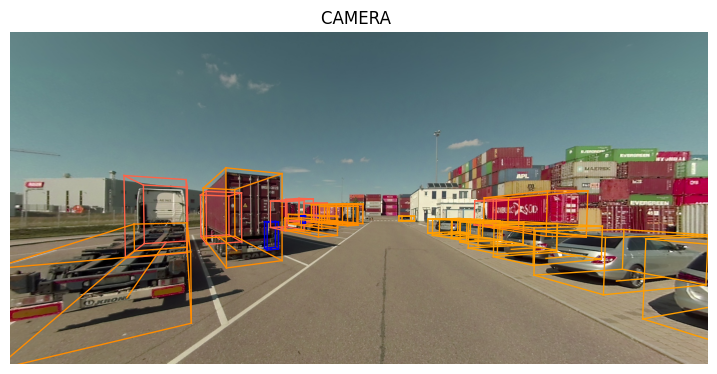

In [11]:
trucksc.render_sample_data(cam_front_data['token'])

### 4. `sample_annotation`

`sample_annotation` refers to any ***bounding box defining the position of an object seen in a sample***. All location data is given with respect to the global coordinate system. Let's examine an example from our `sample` above.

In [12]:
my_annotation_token = my_sample['anns'][14]
my_annotation_metadata =  trucksc.get('sample_annotation', my_annotation_token)
my_annotation_metadata

{'token': '6686f889d85241a29fb03bcfdcfbf6d0',
 'sample_token': '32d2bcf46e734dffb14fe2e0a823d059',
 'instance_token': '6abe4da0c68f49e1bbed0cfa5f8491ff',
 'visibility_token': '6adc1826065b452195ae6a76317b8ab5',
 'attribute_tokens': ['eefd82c9b2f144e2b1c61a432254cff2'],
 'translation': [571700.8574884472, 5367866.8749299375, 594.5638132291496],
 'size': [1.858049, 4.428137, 1.509404],
 'rotation': [0.9781157809269128,
  -8.673617379884035e-19,
  0.0,
  0.20806133495134527],
 'prev': '',
 'next': '6d00f9a968b9434ba7e56274e3f1d260',
 'num_lidar_pts': 1131,
 'num_radar_pts': 0,
 'category_name': 'vehicle.car'}

We can also render an annotation to have a closer look.

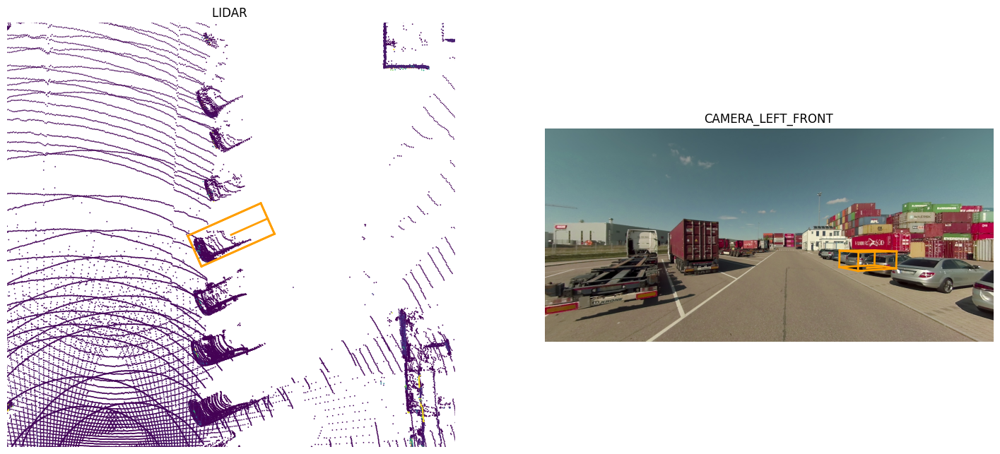

In [13]:
trucksc.render_annotation(my_annotation_token)

### 5. `instance`

Object instance are instances that need to be detected or tracked by an AV (e.g a particular vehicle, pedestrian). Let us examine an instance metadata

In [14]:
my_instance = trucksc.get('instance', my_annotation_metadata['instance_token'])
my_instance

{'token': '6abe4da0c68f49e1bbed0cfa5f8491ff',
 'category_token': 'c9765c01960f41f391ea560531cf7746',
 'nbr_annotations': 35,
 'first_annotation_token': '6686f889d85241a29fb03bcfdcfbf6d0',
 'last_annotation_token': 'e32d17aa5fb24737aad1c2a67a2265ae'}

We generally track an instance across different frames in a particular scene. However, we do not track them across different scenes. In this example, we have 35 annotated samples for this instance across a particular scene.

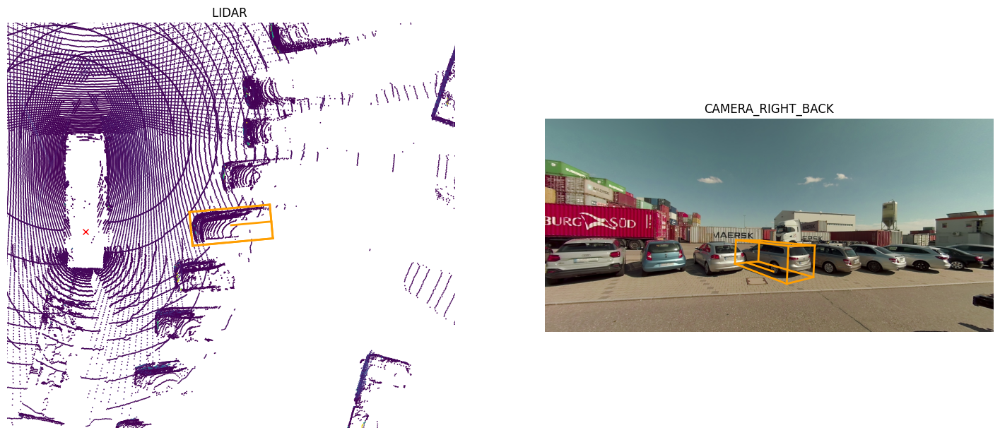

In [15]:
instance_token = my_instance['token']
trucksc.render_instance(instance_token)

An instance record takes note of its first and last annotation token. Let's render them

First annotated sample of this instance:


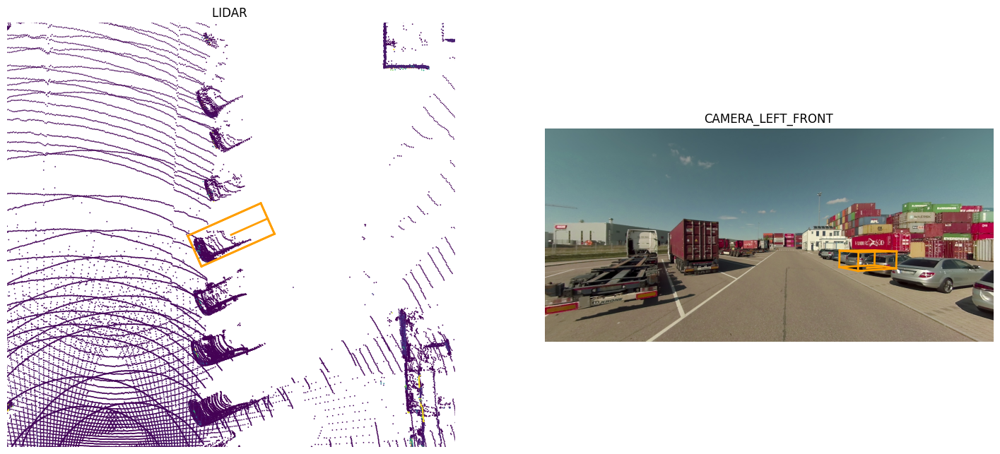

In [16]:
print("First annotated sample of this instance:")
trucksc.render_annotation(my_instance['first_annotation_token'])

Last annotated sample of this instance


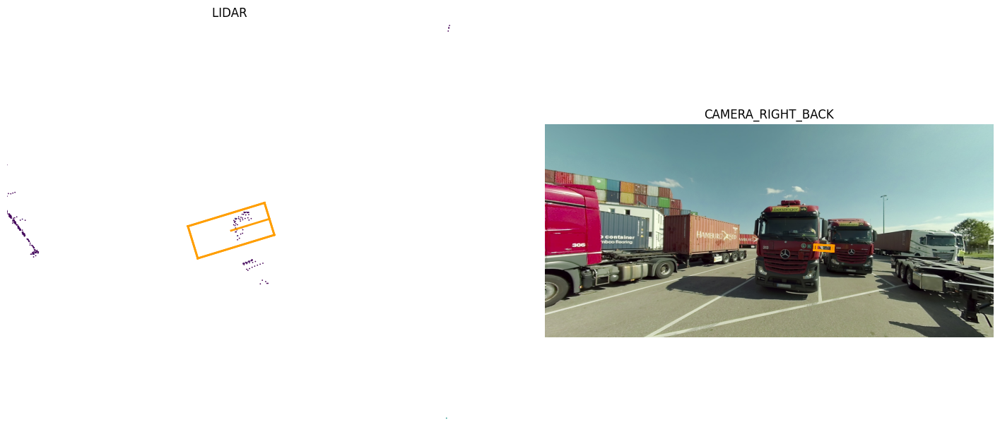

In [17]:
print("Last annotated sample of this instance")
trucksc.render_annotation(my_instance['last_annotation_token'])

### 6. `category`

A `category` is the object assignment of an annotation.  Let's look at the category table we have in our database. The table contains the taxonomy of different object categories and also list the subcategories (delineated by a period). 

In [18]:
trucksc.list_categories()

Category stats for split v1.0-mini:
animal                      n=   31, width= 0.42±0.00, len= 1.00±0.00, height= 0.67±0.00, lw_aspect= 2.40±0.00
human.pedestrian.adult      n= 1010, width= 0.75±0.16, len= 0.77±0.17, height= 1.73±0.23, lw_aspect= 1.06±0.28
human.pedestrian.child      n=   82, width= 0.69±0.26, len= 0.63±0.22, height= 1.29±0.14, lw_aspect= 0.92±0.12
human.pedestrian.constructi n=  172, width= 0.69±0.12, len= 0.86±0.08, height= 1.95±0.06, lw_aspect= 1.29±0.26
human.pedestrian.stroller   n=   39, width= 0.78±0.00, len= 0.92±0.00, height= 1.64±0.00, lw_aspect= 1.18±0.00
movable_object.barrier      n=   42, width= 1.65±0.94, len= 1.00±0.95, height= 1.43±0.16, lw_aspect= 2.49±3.33
movable_object.trafficcone  n=  864, width= 0.54±0.15, len= 0.60±0.18, height= 1.45±0.45, lw_aspect= 1.14±0.22
static_object.traffic_sign  n= 6705, width= 1.68±2.96, len= 0.40±0.25, height= 3.22±1.27, lw_aspect= 0.37±0.19
vehicle.bicycle             n=  134, width= 0.72±0.19, len= 1.78±0.19, heigh

A category record contains the name and the description of that particular category.

In [19]:
trucksc.category[9]

{'token': '097149ba23eb42399459630b8b7e9696',
 'name': 'vehicle.emergency.police',
 'description': 'All types of police vehicles including police bicycles and motorcycles.',
 'index': 10}

Refer to `instructions_truckscenes.md` for the definitions of the different categories.

### 7. `attribute`

An `attribute` is a property of an instance that may change throughout different parts of a scene while the category remains the same. Here we list the provided attributes and the number of annotations associated with a particular attribute.

In [20]:
trucksc.list_attributes()

cycle.with_rider: 171
cycle.without_rider: 43
pedestrian.moving: 1096
pedestrian.standing: 199
traffic_sign.overhanging: 275
traffic_sign.pole_mounted: 6322
traffic_sign.temporary: 135
vehicle.moving: 10297
vehicle.parked: 4554
vehicle.stopped: 1684


Let's take a look at an example how an attribute may change over one scene

In [21]:
my_instance = trucksc.instance[3]
first_token = my_instance['first_annotation_token']
last_token = my_instance['last_annotation_token']
nbr_samples = my_instance['nbr_annotations']
current_token = first_token

i = 0
while current_token != last_token:
    current_ann = trucksc.get('sample_annotation', current_token)
    current_attr = trucksc.get('attribute', current_ann['attribute_tokens'][0])['name']
    
    if i == 0:
        pass
    elif current_attr != last_attr:
        print("Changed from `{}` to `{}` at timestamp {} out of {} annotated timestamps".format(last_attr, current_attr, i, nbr_samples))

    next_token = current_ann['next']
    current_token = next_token
    last_attr = current_attr
    i += 1

Changed from `pedestrian.moving` to `pedestrian.standing` at timestamp 17 out of 40 annotated timestamps
Changed from `pedestrian.standing` to `pedestrian.moving` at timestamp 21 out of 40 annotated timestamps


### 8. `visibility`

`visibility` is defined as the fraction of pixels of a particular annotation that are visible over the 4 camera feeds, grouped into 4 bins.

In [22]:
trucksc.visibility

[{'token': 'f95237cfe4e0480c899fab6d5e5a235c',
  'level': 1,
  'description': 'The object is 0% to 40% visible in panoramic view of all cameras.'},
 {'token': '34fecb88f60d4842931ab1ce2187e6a0',
  'level': 2,
  'description': 'The object is 41% to 60% visible in panoramic view of all cameras.'},
 {'token': 'd8bb855a234c4831a6671a99671bdefa',
  'level': 3,
  'description': 'The object is 61% to 80% visible in panoramic view of all cameras'},
 {'token': '6adc1826065b452195ae6a76317b8ab5',
  'level': 4,
  'description': 'The object is 81% to 100% visible in panoramic view of all cameras.'}]

Let's look at an example `sample_annotation` with 80-100% visibility

Visibility: {'token': '6adc1826065b452195ae6a76317b8ab5', 'level': 4, 'description': 'The object is 81% to 100% visible in panoramic view of all cameras.'}


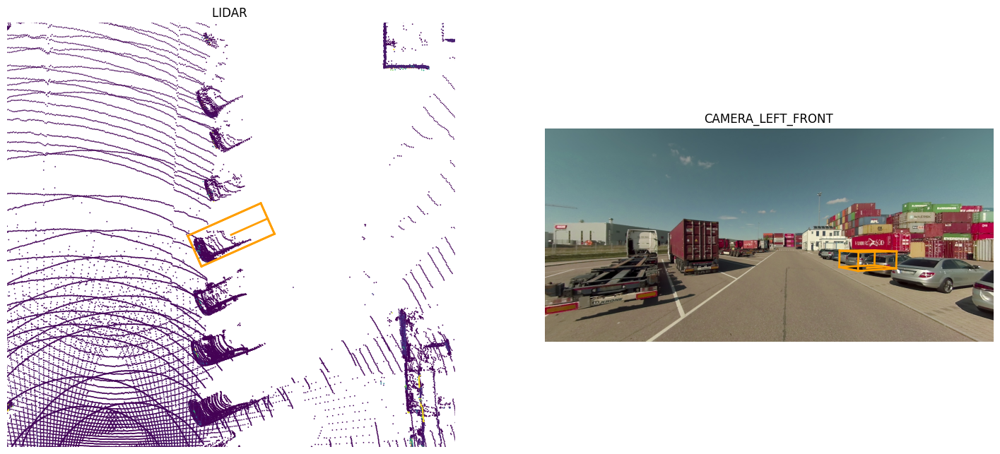

In [23]:
visibility_token = trucksc.get('sample_annotation', my_annotation_token)['visibility_token']

print("Visibility: {}".format(trucksc.get('visibility', visibility_token)))
trucksc.render_annotation(my_annotation_token)

Let's look at an example `sample_annotation` with 0-40% visibility

Visibility: {'token': 'f95237cfe4e0480c899fab6d5e5a235c', 'level': 1, 'description': 'The object is 0% to 40% visible in panoramic view of all cameras.'}


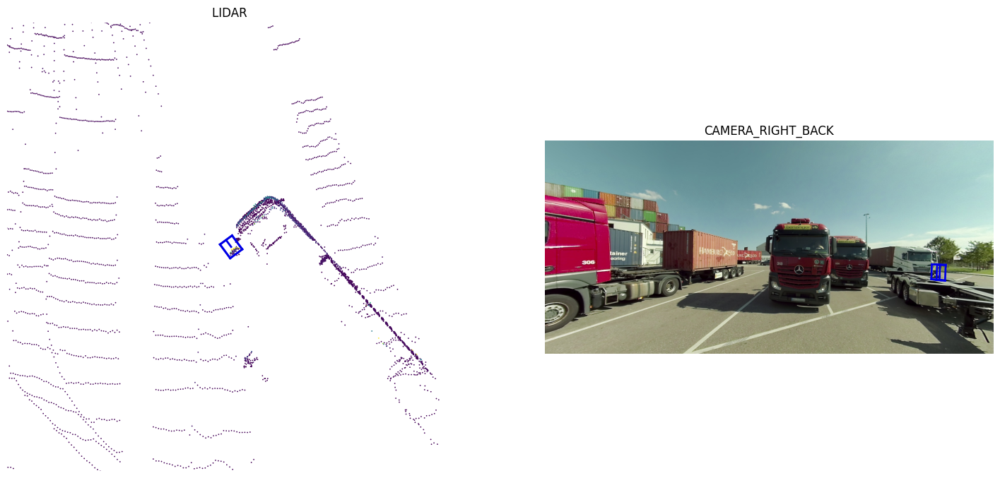

In [24]:
anntoken = '03287f5e06c94b5f9ffa61e937ba7c2d'
visibility_token = trucksc.get('sample_annotation', anntoken)['visibility_token']

print("Visibility: {}".format(trucksc.get('visibility', visibility_token)))
trucksc.render_annotation(anntoken, box_vis_level=0)

### 9. `sensor`

The MAN TruckScenes dataset consists of data collected from our full sensor suite which consists of:
- 6 x LIDAR  
- 6 x RADAR  
- 4 x CAMERA  
- 2 x IMU

Note that IMU data is provided in a dedicated file, similar to ego pose (GNSS) data.

In [25]:
trucksc.sensor

[{'token': 'b3dd3279d239492195f64963ec70b244',
  'channel': 'RADAR_RIGHT_BACK',
  'modality': 'radar'},
 {'token': 'c7b216f6c0c2426ea01e20ffb50ecfb0',
  'channel': 'RADAR_RIGHT_SIDE',
  'modality': 'radar'},
 {'token': '27587edfa74844ce931a710995531ca9',
  'channel': 'RADAR_RIGHT_FRONT',
  'modality': 'radar'},
 {'token': 'fb5519c659a5400c8e9bbf6ec2e50528',
  'channel': 'RADAR_LEFT_FRONT',
  'modality': 'radar'},
 {'token': '0785ec5f7a5e4c93a99fea2ad781783d',
  'channel': 'RADAR_LEFT_SIDE',
  'modality': 'radar'},
 {'token': 'e70adcb9ee16435abc316cfd73c58fd7',
  'channel': 'RADAR_LEFT_BACK',
  'modality': 'radar'},
 {'token': '1c4f2bbb64f847a193c748c1c14f0574',
  'channel': 'LIDAR_LEFT',
  'modality': 'lidar'},
 {'token': 'fe19aa64da874708a8cd417103e7cdc7',
  'channel': 'LIDAR_RIGHT',
  'modality': 'lidar'},
 {'token': '3f53edcde9e44caaba5e689726c7aab7',
  'channel': 'LIDAR_TOP_FRONT',
  'modality': 'lidar'},
 {'token': '9ecd75e3eaf643d5b1d5a6cefba7f1f3',
  'channel': 'LIDAR_TOP_LEFT',

Every `sample_data` has a record on which `sensor` the data is collected from (note the "channel" key)

In [26]:
trucksc.sample_data[10]

{'token': 'c790efd2151d491aae635234a5df26d8',
 'sample_token': '32d2bcf46e734dffb14fe2e0a823d059',
 'ego_pose_token': '9f5d4bc97327401cabe5726c0deb153e',
 'calibrated_sensor_token': 'f2c73d43e0994ee8a16f930860856c0e',
 'timestamp': 1695473372704382,
 'fileformat': 'pcd',
 'is_key_frame': True,
 'height': 1,
 'width': 800,
 'filename': 'samples/RADAR_RIGHT_BACK/RADAR_RIGHT_BACK_1695473372704382.pcd',
 'prev': 'ef21e26b4ec5464fa5332dd6968f37d1',
 'next': 'e6553b44cdda4867aa054320c072eb4e',
 'sensor_modality': 'radar',
 'channel': 'RADAR_RIGHT_BACK'}

### 10. `calibrated_sensor`

`calibrated_sensor` consists of the definition of a particular sensor (lidar/radar/camera/imu) as calibrated on a particular vehicle. Let us look at an example.

In [27]:
trucksc.calibrated_sensor[0]

{'token': 'f2c73d43e0994ee8a16f930860856c0e',
 'sensor_token': 'b3dd3279d239492195f64963ec70b244',
 'translation': [5.0062079, -1.3963761, 2.0017026],
 'rotation': [0.006464122662488554,
  -0.34173618855225424,
  0.9397681579161073,
  0.0032252006059896414],
 'camera_intrinsic': []}

Note that the `translation` and the `rotation` parameters are given with respect to the ego vehicle body frame. 

### 11. `ego_pose`

`ego_pose` contains information about the location (encoded in `translation`) and the orientation (encoded in `rotation`) of the ego vehicle, with respect to the global coordinate system.

In [28]:
trucksc.ego_pose[0]

{'token': '64356138a9934ea189818905f83a511c',
 'timestamp': 1695473372112112,
 'translation': [571694.3090382409, 5367846.151728331, 594.02],
 'rotation': [0.6982511152842495,
  -0.0020606436085560346,
  0.007986344276432824,
  0.7158053869993705]}

### 12. `ego_motion`

`ego_motion` contains information about the velocity (`translational` and `rotational`), acceleration, and orientation of the cabin and chassis of the ego vehicle, with respect to the vehicle coordinate system.

In [29]:
trucksc.ego_motion_cabin[0]

{'token': '0e84f4f0a211433486e2c6bcddc33c9f',
 'timestamp': 1695473372105885,
 'vx': 2.2027922342433244,
 'vy': -0.22545309220941998,
 'vz': 0.07624187068477423,
 'ax': 0.203125,
 'ay': 0.101563,
 'az': 9.777344,
 'yaw': 0.005147022957402977,
 'pitch': -0.01053661807694617,
 'roll': -0.012780147610484516,
 'yaw_rate': -0.070312,
 'pitch_rate': 0.001953,
 'roll_rate': 0.019531}

In [30]:
trucksc.ego_motion_chassis[0]

{'token': '8b3dfa5cab64405a94463d581be025f6',
 'timestamp': 1695473372108052,
 'vx': 2.2187037219058827,
 'vy': -0.0774915519772886,
 'vz': 0.017433642709920375,
 'ax': 1.164063,
 'ay': -0.636719,
 'az': 10.3125,
 'yaw': 0.033592996536636485,
 'pitch': -0.004099504776755802,
 'roll': -0.02135839161232544,
 'yaw_rate': -0.072265,
 'pitch_rate': 0.0,
 'roll_rate': -0.023437}

## MAN TruckScenes Basics

Let's get a bit technical.

The TruckScenes class holds several tables. Each table is a list of records, and each record is a dictionary. For example the first record of the category table is stored at:

In [31]:
trucksc.category[0]

{'token': 'c9765c01960f41f391ea560531cf7746',
 'name': 'vehicle.car',
 'description': 'Vehicle designed primarily for personal use, e.g. sedans, hatch-backs, wagons, vans, mini-vans, SUVs and jeeps.',
 'index': 1}

The category table is simple: it holds the fields `name` and `description`. It also has a `token` field, which is a unique record identifier. Since the record is a dictionary, the token can be accessed like so:

In [32]:
cat_token = trucksc.category[0]['token']
cat_token

'c9765c01960f41f391ea560531cf7746'

If you know the `token` for any record in the DB you can retrieve the record by doing

In [33]:
trucksc.get('category', cat_token)

{'token': 'c9765c01960f41f391ea560531cf7746',
 'name': 'vehicle.car',
 'description': 'Vehicle designed primarily for personal use, e.g. sedans, hatch-backs, wagons, vans, mini-vans, SUVs and jeeps.',
 'index': 1}

_As you can notice, we have recovered the same record!_

OK, that was easy. Let's try something harder. Let's look at the `sample_annotation` table.

In [34]:
trucksc.sample_annotation[0]

{'token': '50873dd5195b47bc9544ac2821e054e0',
 'sample_token': '32d2bcf46e734dffb14fe2e0a823d059',
 'instance_token': '163b7c695f7243779ef5e5f0fd844063',
 'visibility_token': '6adc1826065b452195ae6a76317b8ab5',
 'attribute_tokens': ['eefd82c9b2f144e2b1c61a432254cff2'],
 'translation': [571701.2157594472, 5367870.003885938, 594.4508582291495],
 'size': [1.66326, 3.745129, 1.473757],
 'rotation': [0.9844024900258261,
  -4.336808689942018e-19,
  4.336808689942018e-19,
  0.17593105931288455],
 'prev': '',
 'next': '9f0e8f997dc647bf9a0a20c679b1804d',
 'num_lidar_pts': 465,
 'num_radar_pts': 0,
 'category_name': 'vehicle.car'}

This also has a `token` field (they all do). In addition, it has several fields of the format [a-z]*\_token, _e.g._ instance_token. These are foreign keys in database terminology, meaning they point to another table. 
Using `trucksc.get()` we can grab any of these in constant time. For example, let's look at the visibility record.

In [35]:
trucksc.get('visibility', trucksc.sample_annotation[0]['visibility_token'])

{'token': '6adc1826065b452195ae6a76317b8ab5',
 'level': 4,
 'description': 'The object is 81% to 100% visible in panoramic view of all cameras.'}

The visibility records indicate how much of an object was visible when it was annotated.

Let's also grab the `instance_token`

In [36]:
one_instance = trucksc.get('instance', trucksc.sample_annotation[0]['instance_token'])
one_instance

{'token': '163b7c695f7243779ef5e5f0fd844063',
 'category_token': 'c9765c01960f41f391ea560531cf7746',
 'nbr_annotations': 34,
 'first_annotation_token': '50873dd5195b47bc9544ac2821e054e0',
 'last_annotation_token': '9c0441a927994c6d9f1b12e74d8572f3'}

This points to the `instance` table. This table enumerate the object _instances_ we have encountered in each 
scene. This way we can connect all annotations of a particular object.

If you look carefully at the README tables, you will see that the sample_annotation table points to the instance table, 
but the instance table doesn't list all annotations that point to it. 

So how can we recover all sample_annotations for a particular object instance? There are two ways:

1. `Use trucksc.field2token()`. Let's try it:

In [37]:
ann_tokens = trucksc.field2token('sample_annotation', 'instance_token', one_instance['token'])

This returns a list of all sample_annotation records with the `'instance_token'` == `one_instance['token']`. Let's store these in a set for now

In [38]:
ann_tokens_field2token = set(ann_tokens)

ann_tokens_field2token

{'00a68e4c3b7c4a6bbb6a04fde6f88227',
 '115175fd6394409c808a883e496f1de9',
 '2c37e42d11874cd7bd05b384cca20b33',
 '2c8422f4ac674f949fa1124dcaa1fa5e',
 '384bb8f773d640bd851c2581d8750294',
 '3b39a2f59b964072a2cb279c51a4336d',
 '3b4b4fe3022845a9993b37a396773a62',
 '40237049fb2d4dbaa597e19f7a768e49',
 '48e3e7c046ad44ce9639eb6dd5390b74',
 '50873dd5195b47bc9544ac2821e054e0',
 '58ebd935fdd245489a90fc0f20fe5e20',
 '69410b9d65c94388acdfe3b9c32d9440',
 '74dcbba0822c499ea72252cc706a2931',
 '77a78fc372ac4b1f9cd56016dc793c7d',
 '7ae9d3500cd2488bb11447618be0cb36',
 '7c40ef4f8979457f97fbac16655bb065',
 '7cb1a7723eb844e38356cfb4da057cee',
 '8fbcd0f081ad420ebc995ade915de8e2',
 '943f4f9bcae84112896b5a1136faae24',
 '99cba8890bf842a8bd93244779ac4fbe',
 '9a1237e0e57a4e3ea2728f959e5328cf',
 '9ad9e89c66ca4e128ea3054f10f51524',
 '9c0441a927994c6d9f1b12e74d8572f3',
 '9f0d9b2e8fa14b438dc0a41a90c9ba24',
 '9f0e8f997dc647bf9a0a20c679b1804d',
 '9f818d843ddc40c4ace2e9121df3ff62',
 'bdb8c990e3f94d7b8ebe3e92b464090c',
 

The `trucksc.field2token()` method is generic and can be used in any similar situation.

2. For certain situation, we provide some reverse indices in the tables themselves. This is one such example. 

The instance record has a field `first_annotation_token` which points to the first annotation in time of this instance. 
Recovering this record is easy.

In [39]:
ann_record = trucksc.get('sample_annotation', one_instance['first_annotation_token'])
ann_record

{'token': '50873dd5195b47bc9544ac2821e054e0',
 'sample_token': '32d2bcf46e734dffb14fe2e0a823d059',
 'instance_token': '163b7c695f7243779ef5e5f0fd844063',
 'visibility_token': '6adc1826065b452195ae6a76317b8ab5',
 'attribute_tokens': ['eefd82c9b2f144e2b1c61a432254cff2'],
 'translation': [571701.2157594472, 5367870.003885938, 594.4508582291495],
 'size': [1.66326, 3.745129, 1.473757],
 'rotation': [0.9844024900258261,
  -4.336808689942018e-19,
  4.336808689942018e-19,
  0.17593105931288455],
 'prev': '',
 'next': '9f0e8f997dc647bf9a0a20c679b1804d',
 'num_lidar_pts': 465,
 'num_radar_pts': 0,
 'category_name': 'vehicle.car'}

Now we can traverse all annotations of this instance using the "next" field. Let's try it. 

In [40]:
ann_tokens_traverse = set()
ann_tokens_traverse.add(ann_record['token'])
while not ann_record['next'] == "":
    ann_record = trucksc.get('sample_annotation', ann_record['next'])
    ann_tokens_traverse.add(ann_record['token'])

Finally, let's assert that we recovered the same ann_records as we did using trucksc.field2token:

In [41]:
print(ann_tokens_traverse == ann_tokens_field2token)

True


If you look at the different sensor capturing frequencies, you may have noticed that some sensors have a much higher sample rate than others. However, you may want to find the closest sample_data record to some reference sensor that you are interested in. So, lets assume you want to find the closest ego position to your camera data sample.

To enable this we have implemented the `trucksc.getclosest()` method for you.

In [42]:
sensor = 'CAMERA_LEFT_FRONT'
cam_left_front_data = trucksc.get('sample_data', my_sample['data'][sensor])

closest_ego_pose = trucksc.getclosest('ego_pose', cam_left_front_data['timestamp'])

# Difference in microseconds
delta_t = closest_ego_pose['timestamp'] - cam_left_front_data['timestamp']
print(f"Time difference: {delta_t / 1e6}s")

Time difference: 0.001875s


Be aware that this method has a O(log n) runtime complexity. So, data access using the standard database format is preferred.

## Reverse indexing and short-cuts

The truckscenes tables are normalized, meaning that each piece of information is only given once.
For example, there is one `sensor` record for each `calibrated_sensor` record. Looking at the schema you will notice that the `calibrated_sensor` table has a `sensor_token` field, but that the `sensor` table does not have a corresponding `calibrated_sensor_token` field. But there are plenty of situations where you have a `sensor`, and want to find the corresponding `calibrated_sensor`! So what to do? You can always use the `trucksc.field2token()` method, but that is slow and inconvenient. We therefore add reverse mappings for some common situations including this one.

Further, there are situations where one needs to go through several tables to get a certain piece of information. 
Consider, for example, the category name (e.g. `human.pedestrian`) of a `sample_annotation`. The `sample_annotation` table doesn't hold this information since the category is an instance level constant. Instead the `sample_annotation` table points to a record in the `instance` table. This, in turn, points to a record in the `category` table, where finally the `name` fields stores the required information.

Since it is quite common to want to know the category name of an annotation, we add a `category_name` field to the `sample_annotation` table during initialization of the TruckScenes class.

In this section, we list the short-cuts and reverse indices that are added to the `TruckScenes` class during initialization. These are all created in the `truckscenes.__make_reverse_index__()` method.

### Reverse indices
We add two reverse indices by default.
* The `timestamps` have shortcuts to all `token` for the `trucksc.getclosest()` method.
* The `sample` records have shortcuts to all `sample_annotations` for that record as well as `sample_data` key-frames. Confer `trucksc.list_sample()` method in the previous section for more details on this.

### Shortcuts

The sample_annotation table has a "category_name" shortcut.

_Using shortcut:_

In [43]:
catname = trucksc.sample_annotation[0]['category_name']

_Not using shortcut:_

In [44]:
ann_rec = trucksc.sample_annotation[0]
inst_rec = trucksc.get('instance', ann_rec['instance_token'])
cat_rec = trucksc.get('category', inst_rec['category_token'])

print(catname == cat_rec['name'])

True


The sample_data table has "channel" and "sensor_modality" shortcuts:

In [45]:
# Shortcut
channel = trucksc.sample_data[0]['channel']

# No shortcut
sd_rec = trucksc.sample_data[0]
cs_record = trucksc.get('calibrated_sensor', sd_rec['calibrated_sensor_token'])
sensor_record = trucksc.get('sensor', cs_record['sensor_token'])

print(channel == sensor_record['channel'])

True


## Data Visualizations

We provide list and rendering methods. These are meant both as convenience methods during development, and as tutorials for building your own visualization methods. They are implemented in the TruckScenesExplorer class, with shortcuts through the TruckScenes class itself.

### List methods
There are three list methods available.

1. `list_categories()` lists all categories, counts and statistics of width/length/height in meters and aspect ratio.

In [46]:
trucksc.list_categories()

Category stats for split v1.0-mini:
animal                      n=   31, width= 0.42±0.00, len= 1.00±0.00, height= 0.67±0.00, lw_aspect= 2.40±0.00
human.pedestrian.adult      n= 1010, width= 0.75±0.16, len= 0.77±0.17, height= 1.73±0.23, lw_aspect= 1.06±0.28
human.pedestrian.child      n=   82, width= 0.69±0.26, len= 0.63±0.22, height= 1.29±0.14, lw_aspect= 0.92±0.12
human.pedestrian.constructi n=  172, width= 0.69±0.12, len= 0.86±0.08, height= 1.95±0.06, lw_aspect= 1.29±0.26
human.pedestrian.stroller   n=   39, width= 0.78±0.00, len= 0.92±0.00, height= 1.64±0.00, lw_aspect= 1.18±0.00
movable_object.barrier      n=   42, width= 1.65±0.94, len= 1.00±0.95, height= 1.43±0.16, lw_aspect= 2.49±3.33
movable_object.trafficcone  n=  864, width= 0.54±0.15, len= 0.60±0.18, height= 1.45±0.45, lw_aspect= 1.14±0.22
static_object.traffic_sign  n= 6705, width= 1.68±2.96, len= 0.40±0.25, height= 3.22±1.27, lw_aspect= 0.37±0.19
vehicle.bicycle             n=  134, width= 0.72±0.19, len= 1.78±0.19, heigh

2. `list_attributes()` lists all attributes and counts.

In [47]:
trucksc.list_attributes()

cycle.with_rider: 171
cycle.without_rider: 43
pedestrian.moving: 1096
pedestrian.standing: 199
traffic_sign.overhanging: 275
traffic_sign.pole_mounted: 6322
traffic_sign.temporary: 135
vehicle.moving: 10297
vehicle.parked: 4554
vehicle.stopped: 1684


3. `list_scenes()` lists all scenes in the loaded DB.

In [48]:
trucksc.list_scenes()

[23-08-26 08:13:49] scene-3f542f89ec5241b6a4e30ca743adcf34-29: length: 19.50s, #anns: 3306, desc: weather.overcast;area.highway;daytime.morning;seaso...
[23-09-06 09:09:31] scene-3195e3bfd1de4f9ba82f874790c7856c-15: length: 19.50s, #anns: 1519, desc: weather.overcast;area.highway;daytime.noon;season.s...
[23-09-17 08:19:52] scene-6be74229febb4aad9e7ae1a37217b231-4: length: 19.50s, #anns: 621, desc: weather.overcast;area.terminal;daytime.morning;seas...
[23-09-23 12:49:32] scene-0044384af3d8494e913fb8b14915239e-3: length: 19.50s, #anns: 1280, desc: weather.clear;area.terminal;daytime.noon;season.sum...
[23-10-07 17:35:24] scene-13f4b71b1bd04a9e88747ad8f58a3f67-4: length: 19.50s, #anns: 1255, desc: weather.clear;area.highway;daytime.evening;season.a...
[23-11-14 14:59:34] scene-b201f6e737e34c2d87830fc1e2911516-6: length: 19.50s, #anns: 2938, desc: weather.rain;area.highway;daytime.noon;season.autum...
[23-11-28 12:22:50] scene-b13542304b244af585a646082c57a079-1: length: 19.50s, #anns: 24

### Rendering

First, let's plot a lidar point cloud in an image. Lidar allows us to accurately map the surroundings in 3D.

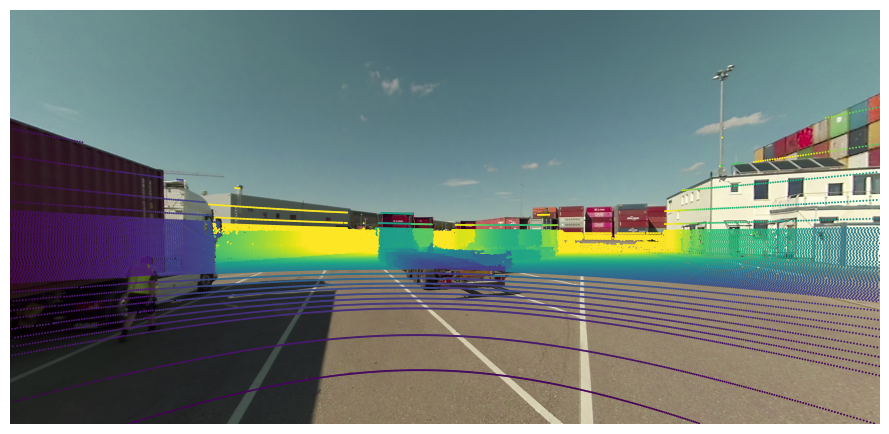

In [49]:
my_sample = trucksc.sample[10]
trucksc.render_pointcloud_in_image(my_sample['token'], pointsensor_channel='LIDAR_LEFT', camera_channel='CAMERA_LEFT_FRONT', dot_size=2)

In the previous image the colors indicate the distance from the ego vehicle to each lidar point. We can also render the lidar intensity. In the following image the pedestrian ahead of us is highly reflective (yellow) and the dark trailer on the left has low reflectivity (purple).

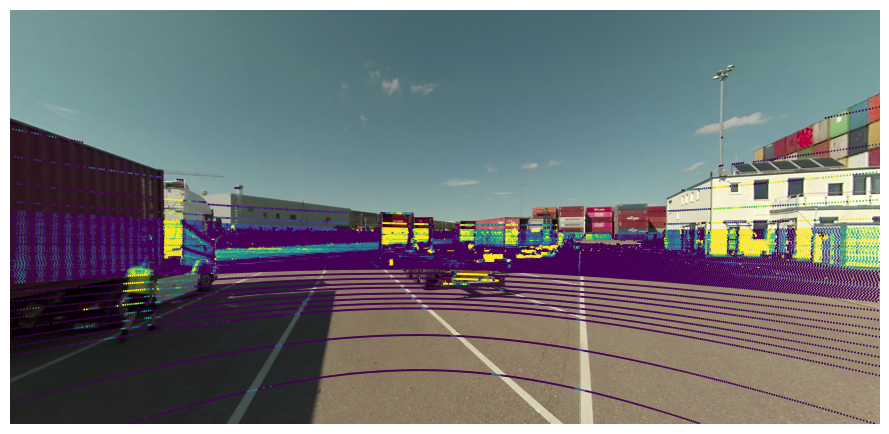

In [50]:
trucksc.render_pointcloud_in_image(my_sample['token'], pointsensor_channel='LIDAR_LEFT', render_intensity=True, dot_size=2)

Second, let's plot the radar point cloud for the same image. Radar is less dense than lidar, but has a larger range and can measure velocity.

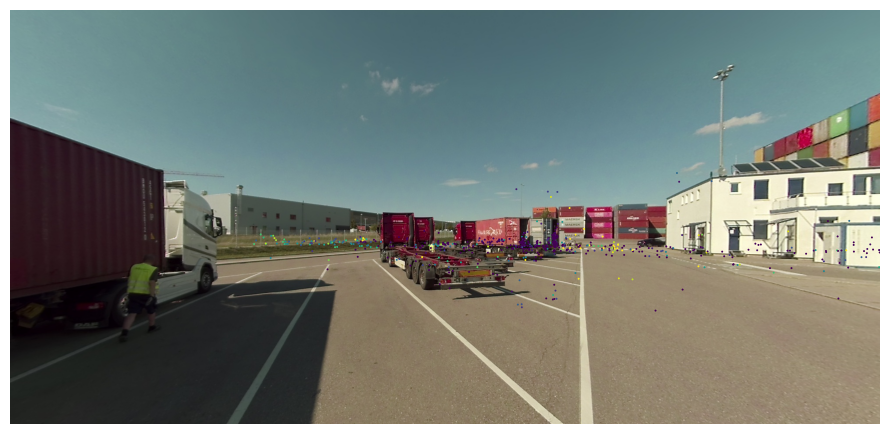

In [51]:
trucksc.render_pointcloud_in_image(my_sample['token'], pointsensor_channel='RADAR_LEFT_FRONT', render_intensity=True, dot_size=2)

We can also plot all annotations across all sample data for that sample. Note how the RCS coloring of the radar is different from the intensity coloring of the lidar.

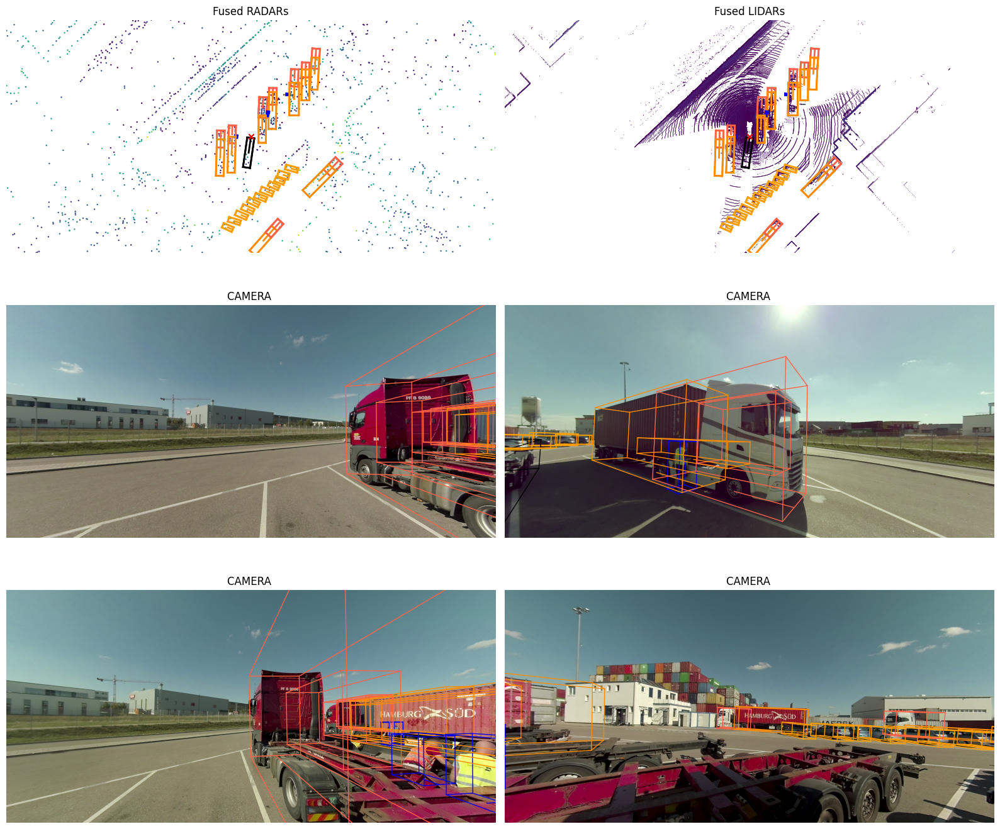

In [52]:
my_sample = trucksc.sample[20]

trucksc.render_sample(my_sample['token'])

Or if we only want to render a particular sensor, we can specify that.

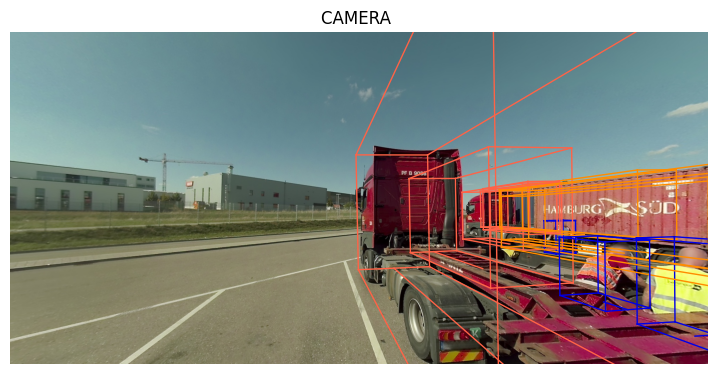

In [53]:
trucksc.render_sample_data(my_sample['data']['CAMERA_RIGHT_FRONT'])

Additionally we can aggregate the point clouds from multiple sweeps to get a denser point cloud.

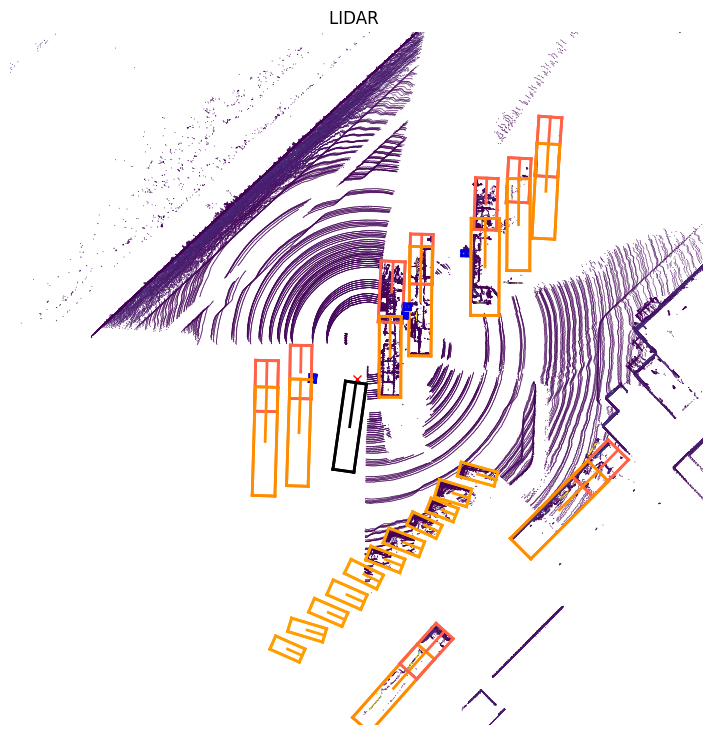

In [54]:
trucksc.render_sample_data(my_sample['data']['LIDAR_RIGHT'], nsweeps=5)


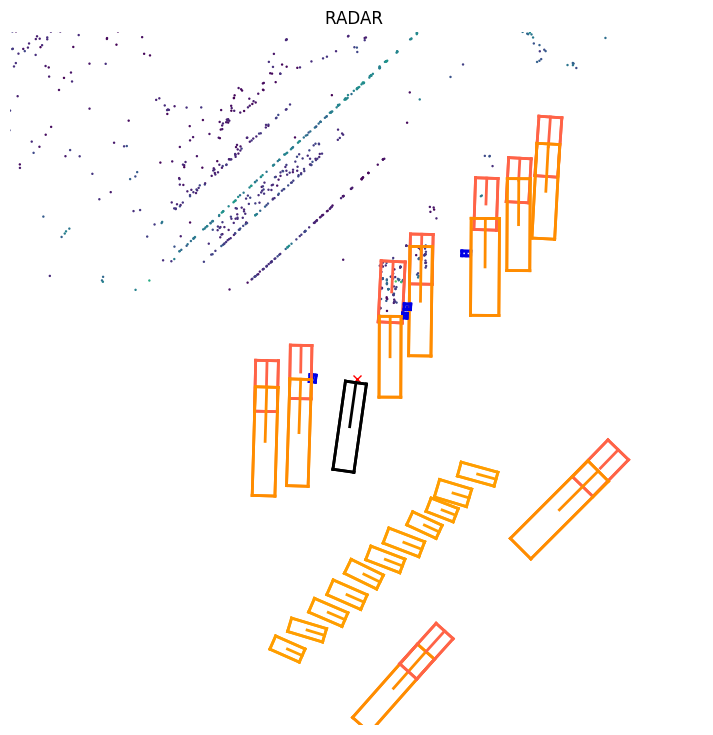

In [55]:
trucksc.render_sample_data(my_sample['data']['RADAR_RIGHT_FRONT'], nsweeps=5)

We can even render a specific annotation.

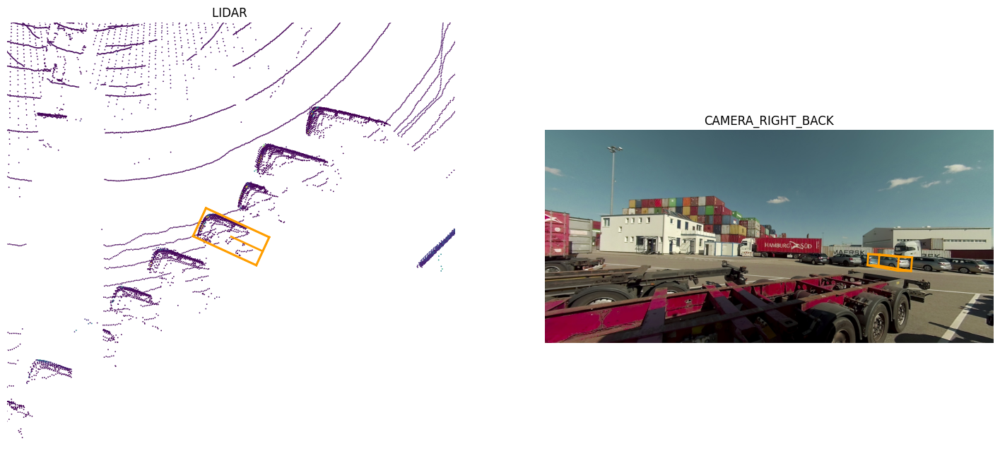

In [56]:
trucksc.render_annotation(my_sample['anns'][0])

### 3D Rendering

In addition to 2D rendering, we can also render data in 3D. There are two options here:

1. trucksc.render_calibrated_sensor() renders the sensor coordinate frames in 3D space.
2. trucksc.render_pointcloud() renders lidar or radar point clouds in 3D space.

NOTE: These methods use Open3D for rendering, which doesn't always play nice with IPython Notebooks. If you experience any issues please run these lines from the command line. 

In [57]:
# The rendering command below is commented out because it may crash in notebooks
# trucksc.render_calibrated_sensor(first_sample_token)

Note that you can pass multiple point cloud channels to the render_pointcloud() method to visualize a fused point cloud. There is also the option to render annotations in 3D and even use multiple sensor sweeps.

In [58]:
# The rendering command below is commented out because it may crash in notebooks
# trucksc.render_pointcloud(my_sample, chans=['LIDAR_LEFT', 'LIDAR_RIGHT'], ref_chan='LIDAR_LEFT', with_anns=True)

### Video Rendering

We can also render a full scene as a video. There are two options here:
1. trucksc.render_scene_channel() renders the video for a particular channel. (HIT ESC to exit)
2. trucksc.render_scene() renders the video for all camera channels.

NOTE: These methods use OpenCV for rendering, which doesn't always play nice with IPython Notebooks. If you experience any issues please run these lines from the command line. 

In [59]:
my_scene_token = trucksc.field2token('scene', 'name', 'scene-3f542f89ec5241b6a4e30ca743adcf34-29')[0]

In [60]:
# The rendering command below is commented out because it may crash in notebooks
# trucksc.render_scene_channel(my_scene_token, 'CAMERA_LEFT_FRONT')

There is also a method trucksc.render_scene() which renders the video for all camera channels. 
This requires a high-res monitor, and is also best run outside this notebook.

In [61]:
# The rendering command below is commented out because it may crash in notebooks
# trucksc.render_scene(my_scene_token)